In [1]:
!pip install pykan

In [303]:
import pandas as pd
from kan import KAN, create_dataset
from sklearn.model_selection import train_test_split
import torch 
import seaborn as sns
import numpy as np 
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler , MinMaxScaler , OrdinalEncoder
from sklearn.metrics import accuracy_score ,classification_report , confusion_matrix

In [304]:
data_n = pd.read_csv("heart_2022_no_nans.csv") 
dict1 = dict(data_n.select_dtypes(include = ["object"]).nunique())
for i in dict1 :
    if dict1[i]>2:
        data_n.drop(columns = [i],inplace = True)

In [305]:
cat_cols = data_n.select_dtypes(include = ["object"])
encoder = OrdinalEncoder()
data_n[cat_cols.columns] = encoder.fit_transform(data_n[cat_cols.columns])
data_n.nunique()
dict2 = dict(data_n.nunique())
cols_to_scale2 = []
for i in dict2 :
    if dict2[i]>2:
        cols_to_scale2.append(i)
cols_to_scale2

['PhysicalHealthDays',
 'MentalHealthDays',
 'SleepHours',
 'HeightInMeters',
 'WeightInKilograms',
 'BMI']

In [306]:
data_n

,Sex,PhysicalHealthDays,MentalHealthDays,PhysicalActivities,SleepHours,HadHeartAttack,HadAngina,HadStroke,HadAsthma,HadSkinCancer,...,DifficultyErrands,ChestScan,HeightInMeters,WeightInKilograms,BMI,AlcoholDrinkers,HIVTesting,FluVaxLast12,PneumoVaxEver,HighRiskLastYear
0,0.0,4.0,0.0,1.0,9.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.60,71.67,27.99,0.0,0.0,1.0,1.0,0.0
1,1.0,0.0,0.0,1.0,6.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.78,95.25,30.13,0.0,0.0,1.0,1.0,0.0
2,1.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.85,108.86,31.66,1.0,0.0,0.0,1.0,0.0
3,0.0,5.0,0.0,1.0,9.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.70,90.72,31.32,0.0,0.0,1.0,1.0,0.0
4,0.0,3.0,15.0,1.0,5.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.55,79.38,33.07,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246017,1.0,0.0,0.0,1.0,6.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.78,102.06,32.28,1.0,0.0,0.0,0.0,0.0
246018,0.0,0.0,7.0,1.0,7.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.93,90.72,24.34,0.0,0.0,0.0,0.0,0.0
246019,1.0,0.0,15.0,1.0,7.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.68,83.91,29.86,1.0,1.0,1.0,1.0,0.0
246020,0.0,2.0,2.0,1.0,7.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.70,83.01,28.66,0.0,1.0,1.0,0.0,0.0


In [307]:
# read the data set 
data = pd.read_csv("heart.csv")
# data.head()

In [308]:
data = data_n.iloc[:4000, :]

In [310]:
data.to_csv("heart_2022_no_nans.csv")

In [266]:
scaler = StandardScaler()
# scaler = MinMaxScaler()

cols_to_scale = ["age","trestbps","chol"]
data[cols_to_scale2] = scaler.fit_transform(data[cols_to_scale2])
# data[cols_to_scale] = scaler.fit_transform(data[cols_to_scale])

# X_train[cols_to_scale] = scaler.fit_transform(X_train[cols_to_scale])
# X_val[cols_to_scale] = scaler.transform(X_val[cols_to_scale])
# X_test[cols_to_scale] = scaler.transform(X_test[cols_to_scale])

/var/folders/4g/xg0f50gx4dx5gtd5bnslt1kc0000gn/T/ipykernel_14091/325775213.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[cols_to_scale2] = scaler.fit_transform(data[cols_to_scale2])


In [268]:
X = data.drop(columns = ["HadHeartAttack"], inplace = False).values
# X = data.drop(columns = ["target"], inplace = False).values

# for binarycrossentropy

y = data["HadHeartAttack"].values
# y = data["target"].values

# # for LBFGS
# y = data["target"].values.reshape(-1,1)

In [269]:
y.shape

(4000,)

In [270]:
pd.DataFrame(X).isna().sum()

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
13    0
14    0
15    0
16    0
17    0
18    0
19    0
20    0
21    0
22    0
23    0
24    0
25    0
26    0
27    0
dtype: int64

In [271]:
# X_train ,X_test , y_train , y_test = train_test_split( X, y , test_size = 0.2 )

In [272]:
X_train ,X_val1 , y_train , y_val1 = train_test_split(X, y , test_size = 0.3)
X_val ,X_test , y_val, y_test = train_test_split(X_val1, y_val1 , test_size = 0.3)

In [273]:
# X_indices = data.columns 
# X.T
# pd.DataFrame({X_indices[i] : X.T[i] for i in range(len(X_indices))})

In [274]:
# defining fucntion to transform data if needed
def f(x):
    return x

In [275]:
m , n = X.shape # num of rows in dataset
# dataset = create_dataset (f, n_var = 14 , train_num = m) # input features

In [276]:
dataset = {}

In [277]:
train_input =  torch.tensor(X_train).clone().detach().float()
train_label =  torch.tensor(y_train , dtype = torch.long).clone().detach()
val_input = torch.tensor(X_val).clone().detach().float()
val_label = torch.tensor(y_val , dtype = torch.long).clone().detach()
test_input = torch.tensor(X_test).clone().detach().float()
test_label = torch.tensor(y_test , dtype = torch.long).clone().detach()

In [278]:
dataset ['train_input'] = train_input
dataset ['train_labels'] = train_label
# dataset ["val1_input"] = torch.tensor(X_val,dtype = torch.float32)
# dataset ["val1_labels"] = torch.tensor(y_val,dtype = torch.float32)
dataset ["val_input"] = val_input
dataset ["val_labels"] = val_label
dataset ['test_input'] = test_input
dataset ['test_labels'] = test_label

In [279]:
# dataset ['train_input'] = torch.tensor(X_train,dtype = torch.float32).clone().detach().float(),
# dataset ['train_labels'] = torch.tensor(y_train,dtype = torch.float32).clone().detach().float(),
# # dataset ["val1_input"] = torch.tensor(X_val,dtype = torch.float32)
# # dataset ["val1_labels"] = torch.tensor(y_val,dtype = torch.float32)
# dataset ["val_input"] = torch.tensor(X_val,dtype = torch.float32).clone().detach().float(),
# dataset ["val_labels"] = torch.tensor(y_val,dtype = torch.float32).clone().detach().float(),
# dataset ['test_input'] = torch.tensor(X_test,dtype = torch.float32).clone().detach().float(),
# dataset ['test_labels'] = torch.tensor(y_test,dtype = torch.float32).clone().detach().float(),

In [280]:
dataset

{'train_input': tensor([[ 1.0000, -0.5005, -0.5011,  ...,  1.0000,  0.0000,  0.0000],
         [ 1.0000,  2.9245, -0.2578,  ...,  0.0000,  0.0000,  0.0000],
         [ 1.0000, -0.2722, -0.5011,  ...,  1.0000,  1.0000,  0.0000],
         ...,
         [ 1.0000, -0.5005, -0.5011,  ...,  1.0000,  1.0000,  0.0000],
         [ 1.0000, -0.5005, -0.3795,  ...,  0.0000,  1.0000,  0.0000],
         [ 0.0000, -0.5005,  1.3232,  ...,  0.0000,  0.0000,  0.0000]]),
 'train_labels': tensor([0, 0, 0,  ..., 0, 0, 0]),
 'val_input': tensor([[ 1.0000, -0.5005, -0.5011,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000, -0.5005, -0.5011,  ...,  1.0000,  1.0000,  0.0000],
         [ 1.0000,  0.0703, -0.5011,  ...,  1.0000,  1.0000,  0.0000],
         ...,
         [ 0.0000, -0.3864, -0.1362,  ...,  1.0000,  0.0000,  0.0000],
         [ 0.0000, -0.5005, -0.5011,  ...,  1.0000,  1.0000,  0.0000],
         [ 0.0000, -0.1580, -0.5011,  ...,  1.0000,  0.0000,  0.0000]]),
 'val_labels': tensor([0, 0, 0, 1, 0,

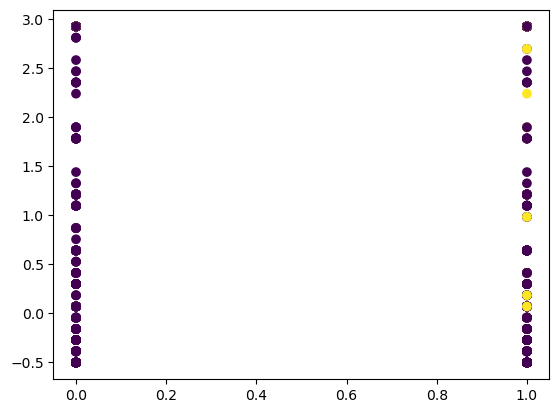

In [281]:
X = dataset ["train_input"]
y = dataset ["train_labels"] 
plt.scatter(X[:,0],X[:,1] , c = y[:])

In [282]:
model = KAN (width = [n,2] , grid = 5 , k=3 , seed = 0)
model(dataset["train_input"])
model.plot(scale=20)
# plotting the initial model

In [283]:
def train_acc():
    preds = torch.argmax(model(dataset['train_input']), dim=1)
    return torch.mean((preds == dataset['train_labels']).float())

def test_acc():
    preds = torch.argmax(model(dataset['test_input']), dim=1)
    return torch.mean((preds == dataset['test_labels']).float())

In [284]:
results = model.train({'train_input': train_input, 'train_label': train_label, 'test_input': val_input, 'test_label': val_label},
                      metrics=(train_acc, test_acc),
                      opt="LBFGS", steps=100, loss_fn=torch.nn.CrossEntropyLoss())
# results = model.train({'train_input': train_input, 'train_label': train_label, 'test_input': val_input, 'test_label': val_label},
#                       opt="LBFGS" , steps = 100)
# results = model.train(dataset , opt="Adam", steps=100, loss_fn=torch.nn.CrossEntropyLoss())
model.plot(scale=20)

train loss: 3.93e-01 | test loss: 4.40e-01 | reg: 2.33e+01 : 100%|█| 100/100 [00:47<00:00,  2.12it/s


In [285]:
lib = ['x','x^2','x^3' ,'x^4' , 'exp' , 'log' , 'sqrt' ,'tanh' , 'sin' ,'abs']
model.auto_symbolic(lib = lib)

fixing (0,0,0) with exp, r2=1.0000009536743164
fixing (0,0,1) with sin, r2=1.0000009536743164
fixing (0,1,0) with abs, r2=0.7431381940841675
fixing (0,1,1) with tanh, r2=0.7465001940727234
fixing (0,2,0) with abs, r2=0.830030620098114
fixing (0,2,1) with sin, r2=0.8289359211921692
fixing (0,3,0) with x^3, r2=1.0000009536743164
fixing (0,3,1) with x^2, r2=1.0000009536743164
fixing (0,4,0) with sin, r2=0.9936935305595398
fixing (0,4,1) with sin, r2=0.9984551072120667
fixing (0,5,0) with x^3, r2=1.0000011920928955
fixing (0,5,1) with exp, r2=1.000001311302185
fixing (0,6,0) with abs, r2=1.000001072883606
fixing (0,6,1) with exp, r2=1.000001311302185
fixing (0,7,0) with exp, r2=1.0000008344650269
fixing (0,7,1) with exp, r2=1.0000007152557373
fixing (0,8,0) with x^4, r2=1.0000009536743164
fixing (0,8,1) with x^2, r2=1.0000011920928955
fixing (0,9,0) with exp, r2=1.0000009536743164
fixing (0,9,1) with exp, r2=1.000001072883606
fixing (0,10,0) with exp, r2=1.0000009536743164
fixing (0,10,1) 

In [286]:
model.symbolic_formula()[0][0]

-0.17*(0.1 - x_18)**2 + 0.52*(0.14 - x_21)**2 - 0.28*(0.18 - x_27)**2 - 0.07*(0.9 - x_14)**3 - 0.32*(1 - 0.25*x_19)**2 - 19.39*sqrt(1 - 0.13*x_22) + 0.05*(-0.42*x_12 - 1)**4 + 0.03*(-x_13 - 0.46)**3 + 0.1*(-x_17 - 0.18)**3 - 5.09*sqrt(0.43*x_23 + 1) + 0.22*(-0.12*x_25 - 1)**4 - 0.01*(-x_4 - 0.39)**3 + 0.36*(-x_6 - 0.51)**3 + 0.02*exp(1.53*x_15) + 0.01*exp(2.8*x_28) - 0.03*log(6.04 - 5.94*x_26) - 0.13*log(3.16*x_20 + 0.2) + 19.0*sin(9.61*x_5 + 1.41) - 0.02*Abs(8.66*x_2 + 2.81) - 0.09*Abs(3.26*x_3 - 7.93) - 0.05*Abs(9.35*x_7 + 6.35) + 18.9 - 0.3*exp(-8.15*x_24) + 0.08*exp(-4.9*x_10) + 0.67*exp(-9.4*x_1)

In [287]:
test_preds = torch.argmax(model.forward(test_input).detach(),dim=1)
train_preds = torch.argmax(model.forward(train_input).detach(),dim=1)
val_preds = torch.argmax(model.forward(val_input).detach(),dim=1)

In [288]:
# model.forward(test_input).detach()

In [289]:
print("Train ACC:", accuracy_score(train_label.numpy(), train_preds.numpy()))

print("Val ACC:", accuracy_score(val_label.numpy(), val_preds.numpy()))

print("Test ACC:", accuracy_score(test_label.numpy(), test_preds.numpy()))

Train ACC: 0.9403571428571429
Val ACC: 0.9369047619047619
Test ACC: 0.9277777777777778


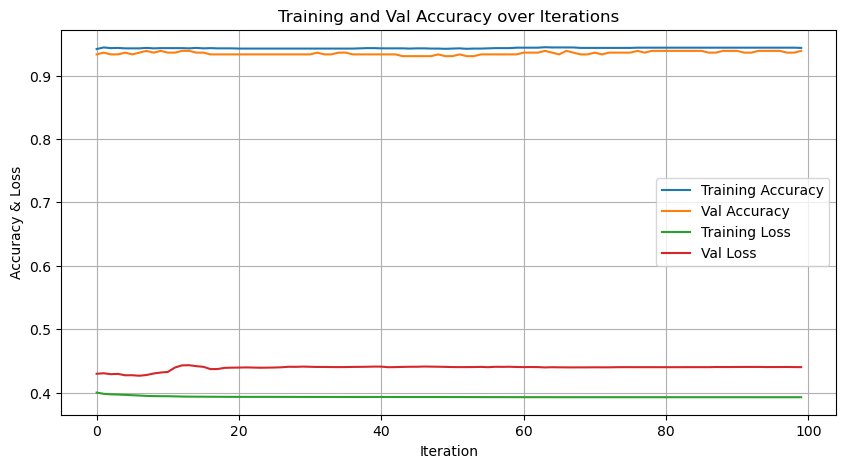

In [290]:
plt.figure(figsize=(10, 5))
plt.plot(results["train_acc"], label='Training Accuracy')
plt.plot(results["test_acc"], label='Val Accuracy')
plt.plot(results["train_loss"], label='Training Loss')
plt.plot(results["test_loss"], label='Val Loss')
plt.title('Training and Val Accuracy over Iterations')
plt.xlabel('Iteration')
plt.ylabel('Accuracy & Loss')
plt.legend()
plt.grid(True)
plt.show()

In [296]:
print (classification_report(test_preds, y_test))

              precision    recall  f1-score   support

           0       0.98      0.94      0.96       351
           1       0.13      0.33      0.19         9

    accuracy                           0.93       360
   macro avg       0.56      0.64      0.57       360
weighted avg       0.96      0.93      0.94       360



In [298]:
confusion_matrix(test_preds, y_test)

array([[331,  20],
       [  6,   3]])

<Axes: >

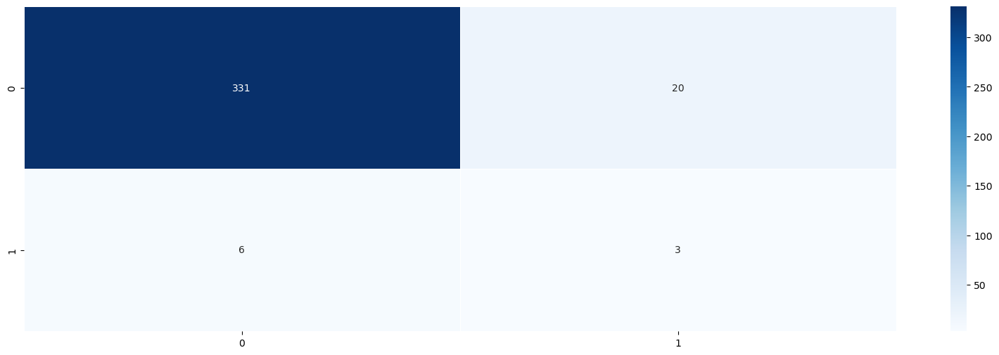

In [302]:
plt.subplots(figsize=(20, 6))
sns.heatmap(confusion_matrix(test_preds, y_test), annot = True, fmt="d", cmap="Blues", linewidths=.5)